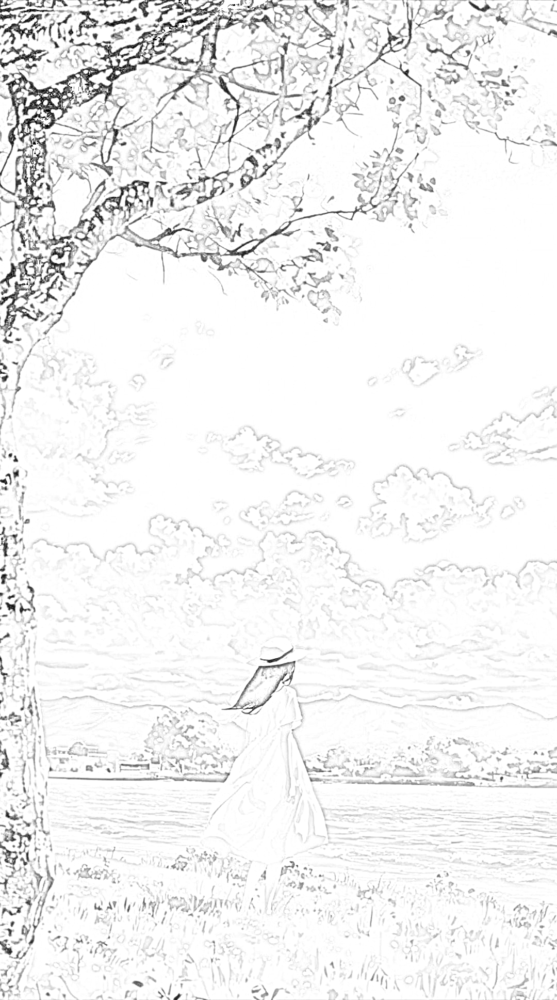

In [1]:

import cv2
from google.colab.patches import cv2_imshow

# Load the image
image = cv2.imread("/content/girl.JPG")

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Create an inverted grayscale image
inverted = 255 - gray_image

# Apply Gaussian blur to the inverted image
blur = cv2.GaussianBlur(inverted, (21, 21), 0)

# Create an inverted blur image
invertedblur = 255 - blur

# Create the sketch effect
sketch = cv2.divide(gray_image, invertedblur, scale=256.0)

# Save the resulting image
cv2.imwrite("sketch.png", sketch)

# Display the resulting image
cv2_imshow(sketch)


Color Legend (Number: RGB): {1: (212, 138, 4), 2: (32, 124, 101), 3: (209, 182, 132), 4: (22, 70, 56), 5: (16, 19, 13), 6: (116, 161, 163), 7: (201, 159, 73), 8: (235, 223, 200), 9: (76, 76, 30), 10: (15, 172, 155)}


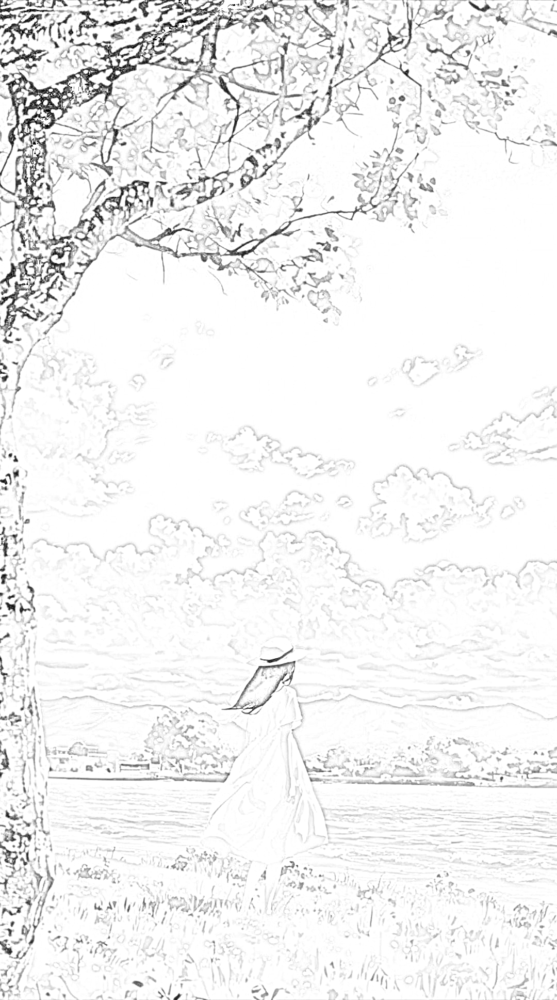

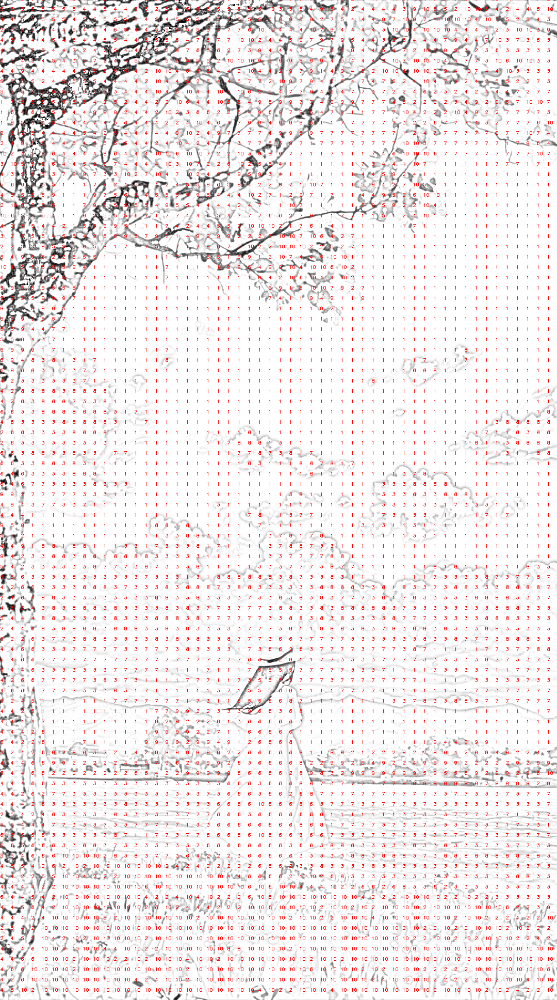

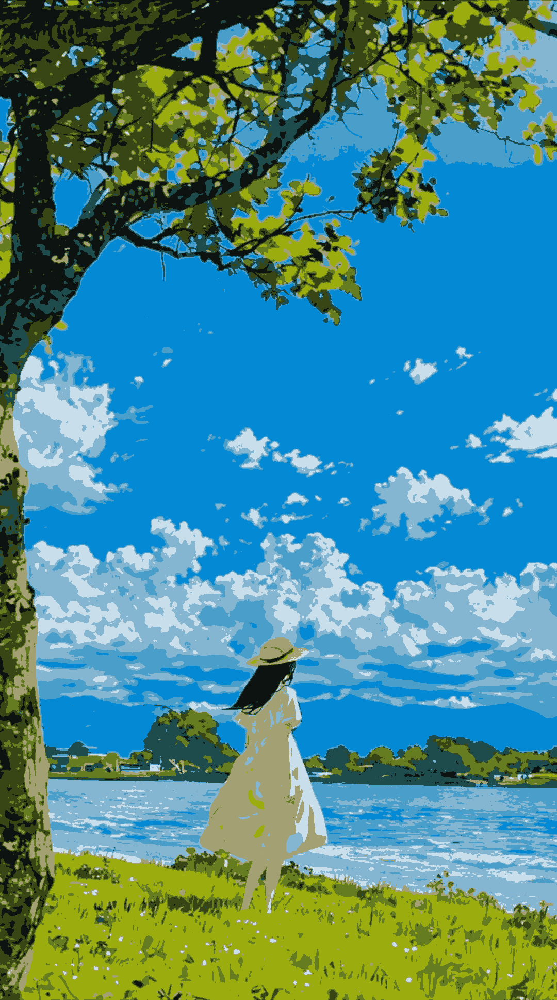

True

In [2]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from google.colab.patches import cv2_imshow

# **Step 1: Extract Colors from the Input Image**
def extract_colors(image, num_colors=10):
    # Reshape the image to a 2D array of pixels
    pixels = image.reshape(-1, 3)

    # Apply KMeans to find dominant colors
    kmeans = KMeans(n_clusters=num_colors, random_state=42)
    kmeans.fit(pixels)

    # Get the cluster centers (dominant colors)
    colors = kmeans.cluster_centers_.astype(int)
    labels = kmeans.labels_.reshape(image.shape[:2])
    return colors, labels

# **Step 2: Assign Numbers to Colors**
def create_color_legend(colors):
    legend = {i + 1: tuple(color) for i, color in enumerate(colors)}
    return legend

# **Step 3: Generate Pencil Sketch**
def create_pencil_sketch(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    inverted = 255 - gray_image
    blur = cv2.GaussianBlur(inverted, (21, 21), 0)
    inverted_blur = 255 - blur
    sketch = cv2.divide(gray_image, inverted_blur, scale=256.0)
    return sketch

# **Step 4: Overlay Numbers on the Sketch**
def overlay_numbers_on_sketch(sketch, labels):
    sketch_with_numbers = cv2.cvtColor(sketch, cv2.COLOR_GRAY2BGR)
    font = cv2.FONT_HERSHEY_SIMPLEX

    for y in range(labels.shape[0]):
        for x in range(labels.shape[1]):
            # Annotate with numbers at sparse intervals to avoid clutter
            if x % 20 == 0 and y % 20 == 0:  # Adjust the step for density
                num = labels[y, x] + 1  # Number starts from 1
                cv2.putText(sketch_with_numbers, str(num), (x, y), font, 0.3, (0, 0, 255), 1)
    return sketch_with_numbers

# **Step 5: Color the Sketch**
def color_sketch(sketch, labels, legend):
    colored_sketch = np.zeros_like(sketch)

    for y in range(labels.shape[0]):
        for x in range(labels.shape[1]):
            num = labels[y, x] + 1  # Number starts from 1
            color = legend[num]
            colored_sketch[y, x] = color

    return colored_sketch

# Main workflow
image_path = "/content/girl.JPG"  # Path to your input image
image = cv2.imread(image_path)

# Step 1: Extract colors and labels
num_colors = 10
colors, labels = extract_colors(image, num_colors=num_colors)

# Step 2: Create a color legend
legend = create_color_legend(colors)

# Step 3: Create pencil sketch
sketch = create_pencil_sketch(image)

# Step 4: Overlay numbers on the sketch
sketch_with_numbers = overlay_numbers_on_sketch(sketch, labels)

# Step 5: Color the sketch
colored_sketch = color_sketch(image, labels, legend)

# Display results
print("Color Legend (Number: RGB):", legend)

cv2_imshow(sketch)
cv2_imshow(sketch_with_numbers)
cv2_imshow(colored_sketch)

# Save outputs
cv2.imwrite("pencil_sketch.png", sketch)
cv2.imwrite("sketch_with_numbers.png", sketch_with_numbers)
cv2.imwrite("colored_sketch.png", colored_sketch)


Enhanced Color Legend (Number: BGR):
1: (210, 132, 2)
2: (243, 179, 77)
3: (15, 171, 153)
4: (151, 93, 5)
5: (98, 228, 221)
6: (93, 56, 8)
7: (175, 148, 98)
8: (230, 208, 159)
9: (21, 86, 72)
10: (92, 131, 126)
11: (245, 248, 234)
12: (10, 18, 8)


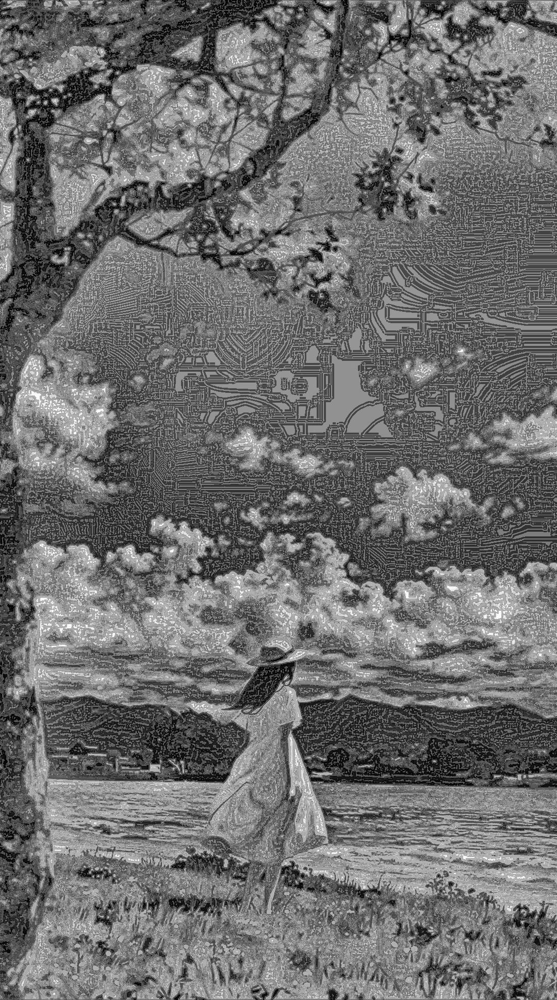

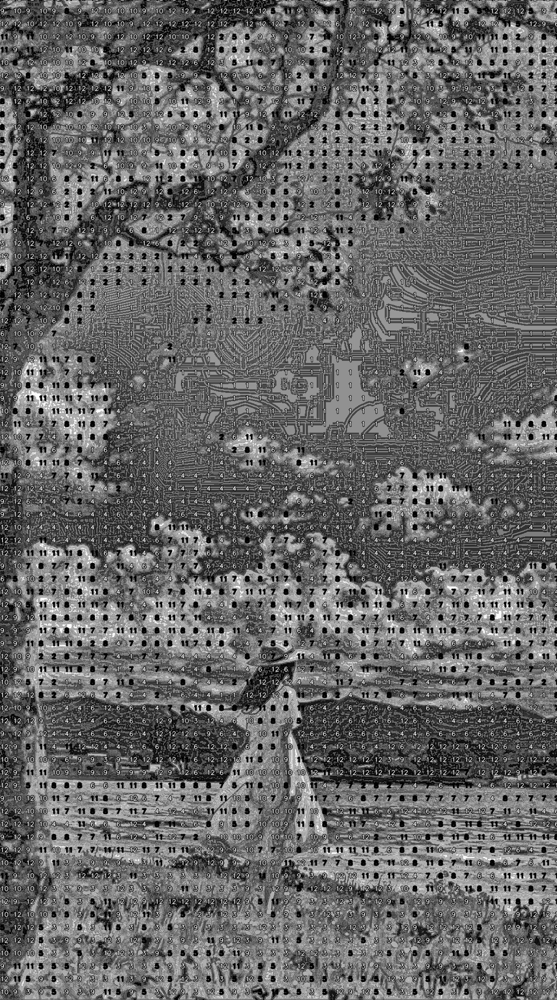

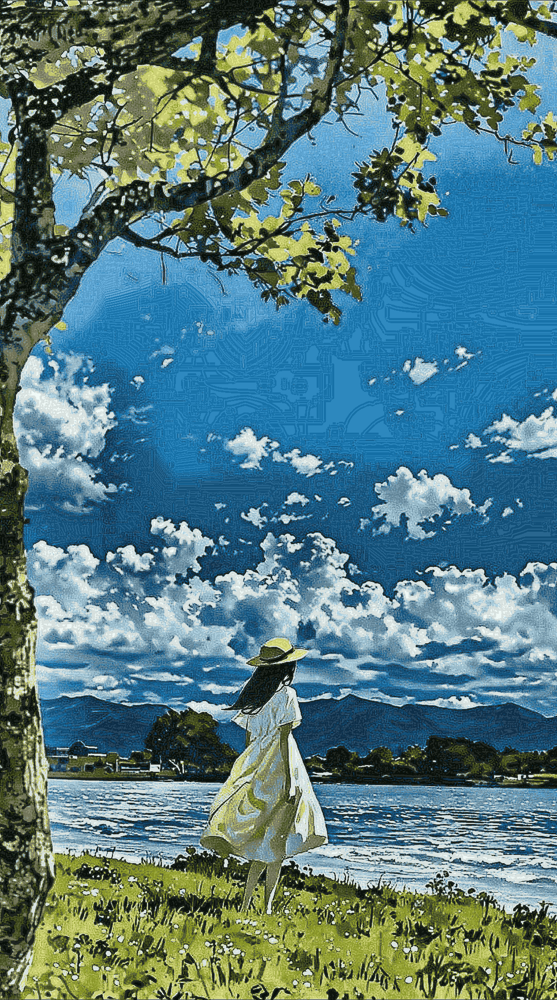

True

In [3]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from scipy.spatial import distance
import colorsys

def enhance_image(image):
    """Enhance image before processing"""
    # Convert to LAB color space for better color perception
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
    l, a, b = cv2.split(lab_image)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    l = clahe.apply(l)

    # Merge channels
    enhanced_lab = cv2.merge([l, a, b])

    # Convert back to BGR
    enhanced_bgr = cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2BGR)

    # Apply subtle sharpening
    kernel = np.array([[-1,-1,-1],
                      [-1, 9,-1],
                      [-1,-1,-1]])
    enhanced_bgr = cv2.filter2D(enhanced_bgr, -1, kernel)

    return enhanced_bgr

def extract_dominant_colors(image, num_colors=10):
    """Extract dominant colors using both KMeans and GMM"""
    # Reshape the image
    pixels = image.reshape(-1, 3)

    # Apply both KMeans and GMM
    kmeans = KMeans(n_clusters=num_colors, random_state=42, n_init=10)
    gmm = GaussianMixture(n_components=num_colors, random_state=42)

    kmeans.fit(pixels)
    gmm.fit(pixels)

    # Get colors from both models
    kmeans_colors = kmeans.cluster_centers_
    gmm_colors = gmm.means_

    # Combine and reduce to unique colors
    all_colors = np.vstack((kmeans_colors, gmm_colors))

    # Remove similar colors
    final_colors = []
    for color in all_colors:
        if not any(distance.euclidean(color, c) < 30 for c in final_colors):
            final_colors.append(color)

    final_colors = np.array(final_colors)[:num_colors]

    # Sort colors by saturation and brightness
    hsv_colors = [colorsys.rgb_to_hsv(r/255, g/255, b/255) for b, g, r in final_colors]
    sorted_indices = np.argsort([-hsv[1] * hsv[2] for hsv in hsv_colors])
    final_colors = final_colors[sorted_indices]

    return final_colors.astype(int)

def create_enhanced_sketch(image):
    """Create an enhanced pencil sketch"""
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply bilateral filter to reduce noise while preserving edges
    smooth = cv2.bilateralFilter(gray, 9, 75, 75)

    # Create edge mask
    edges = cv2.Laplacian(smooth, cv2.CV_8U, ksize=5)

    # Enhance edges
    edges = cv2.adaptiveThreshold(
        edges,
        255,
        cv2.ADAPTIVE_THRESH_MEAN_C,
        cv2.THRESH_BINARY,
        blockSize=9,
        C=2
    )

    # Combine with original grayscale
    sketch = cv2.addWeighted(gray, 0.7, edges, 0.3, 0)

    return sketch

def assign_colors(image, colors):
    """Assign colors to image regions using color similarity"""
    # Reshape image and colors
    pixels = image.reshape(-1, 3)
    labels = np.zeros(len(pixels), dtype=np.int32)

    # Assign each pixel to nearest color
    for i, pixel in enumerate(pixels):
        distances = [distance.euclidean(pixel, color) for color in colors]
        labels[i] = np.argmin(distances)

    return labels.reshape(image.shape[:2])

def overlay_numbers_enhanced(sketch, labels, colors):
    """Create enhanced number overlay with better visibility"""
    sketch_with_numbers = cv2.cvtColor(sketch, cv2.COLOR_GRAY2BGR)
    font = cv2.FONT_HERSHEY_SIMPLEX

    # Calculate contrast color for each region
    height, width = labels.shape
    step = 25  # Increased step size for less cluttered numbers

    for y in range(0, height, step):
        for x in range(0, width, step):
            if y < height and x < width:
                num = labels[y, x] + 1
                color = colors[labels[y, x]]
                # Calculate contrast color (black or white)
                brightness = np.sum(color) / 3
                text_color = (0, 0, 0) if brightness > 127 else (255, 255, 255)

                # Add number with outline for better visibility
                cv2.putText(sketch_with_numbers, str(num), (x, y), font, 0.4,
                          (0, 0, 0), 2, cv2.LINE_AA)
                cv2.putText(sketch_with_numbers, str(num), (x, y), font, 0.4,
                          text_color, 1, cv2.LINE_AA)

    return sketch_with_numbers

def color_sketch_enhanced(sketch, labels, colors):
    """Create enhanced colored sketch with better blending"""
    height, width = labels.shape
    colored = np.zeros((height, width, 3), dtype=np.uint8)

    # Create colored regions
    for y in range(height):
        for x in range(width):
            colored[y, x] = colors[labels[y, x]]

    # Blend with original sketch for texture
    sketch_3ch = cv2.cvtColor(sketch, cv2.COLOR_GRAY2BGR)
    result = cv2.addWeighted(colored, 0.7, sketch_3ch, 0.3, 0)

    return result

# Main workflow
def process_image(image_path, num_colors=10):
    # Read and enhance image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Could not read image at path: {image_path}")

    enhanced_image = enhance_image(image)

    # Extract colors
    colors = extract_dominant_colors(enhanced_image, num_colors)

    # Create labels
    labels = assign_colors(enhanced_image, colors)

    # Create enhanced sketch
    sketch = create_enhanced_sketch(enhanced_image)

    # Create outputs
    sketch_with_numbers = overlay_numbers_enhanced(sketch, labels, colors)
    colored_sketch = color_sketch_enhanced(sketch, labels, colors)

    # Create color legend
    legend = {i + 1: tuple(color) for i, color in enumerate(colors)}

    return sketch, sketch_with_numbers, colored_sketch, legend

# Usage
image_path = "/content/girl.JPG"
sketch, sketch_with_numbers, colored_sketch, legend = process_image(image_path, num_colors=12)

# Display results
print("Enhanced Color Legend (Number: BGR):")
for num, color in legend.items():
    print(f"{num}: {color}")

cv2_imshow(sketch)
cv2_imshow(sketch_with_numbers)
cv2_imshow(colored_sketch)

# Save outputs
cv2.imwrite("enhanced_sketch.png", sketch)
cv2.imwrite("enhanced_sketch_with_numbers.png", sketch_with_numbers)
cv2.imwrite("enhanced_colored_sketch.png", colored_sketch)